In [6]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

df = pd.read_csv('listing_data_publish.csv')

print(df.head())
print(df.shape)
print(df.info())
print(df.isnull().sum())
print(df.describe())
print(df.describe(include=['object']))

categorical_columns = df.select_dtypes(include=['object']).columns.tolist()
numerical_columns = df.select_dtypes(include=['int64', 'float64']).columns.tolist()

if 'Category' in df.columns:
    plt.figure(figsize=(10, 5))
    sns.countplot(y=df['Category'], order=df['Category'].value_counts().index, palette="viridis")
    plt.title('Distribution of Listings Across Categories')
    plt.xlabel('Count')
    plt.ylabel('Category')
    plt.show()

if 'Region' in df.columns:
    plt.figure(figsize=(10, 5))
    sns.countplot(y=df['Region'], order=df['Region'].value_counts().index, palette="coolwarm")
    plt.title('Distribution of Listings Across Regions')
    plt.xlabel('Count')
    plt.ylabel('Region')
    plt.show()

for col in categorical_columns:
    print(f"{col}: {df[col].nunique()} unique values")


   listing_id   type sub_type start_date end_date listing_type building_age  \
0           1  Konut    Daire     1/3/19   1/3/19      satılık            3   
1           2  Konut    Daire     1/2/19   1/2/19      satılık            0   
2           3  Konut    Daire     1/2/19   1/2/19      satılık            0   
3           4  Konut    Daire     1/2/19   1/2/19      satılık            0   
4           5  Konut    Daire     1/2/19   1/2/19      satılık            0   

  total_floor_count floor_no room_count   size  student_avaliable  \
0                 4    Kot 3        3+1  130.0                NaN   
1                 5        1        4+1  175.0                NaN   
2                 3        1        3+1  125.0                NaN   
3                10        7        2+1   72.0                NaN   
4                 4        3        1+1   75.0                NaN   

   mortgage_avaliable                           address furnished  \
0                 NaN              Kocael

2. Data Visualization

● Create multi-dimensional visualizations to reveal patterns in property listings

● Develop informative charts to explore relationships between different property features

● Visualize data distributions to identify potential anomalies or interesting patterns

   listing_id   type sub_type start_date end_date listing_type building_age  \
0           1  Konut    Daire     1/3/19   1/3/19      satılık            3   
1           2  Konut    Daire     1/2/19   1/2/19      satılık            0   
2           3  Konut    Daire     1/2/19   1/2/19      satılık            0   
3           4  Konut    Daire     1/2/19   1/2/19      satılık            0   
4           5  Konut    Daire     1/2/19   1/2/19      satılık            0   

  total_floor_count floor_no room_count   size  student_avaliable  \
0                 4    Kot 3        3+1  130.0                NaN   
1                 5        1        4+1  175.0                NaN   
2                 3        1        3+1  125.0                NaN   
3                10        7        2+1   72.0                NaN   
4                 4        3        1+1   75.0                NaN   

   mortgage_avaliable                           address furnished  \
0                 NaN              Kocael

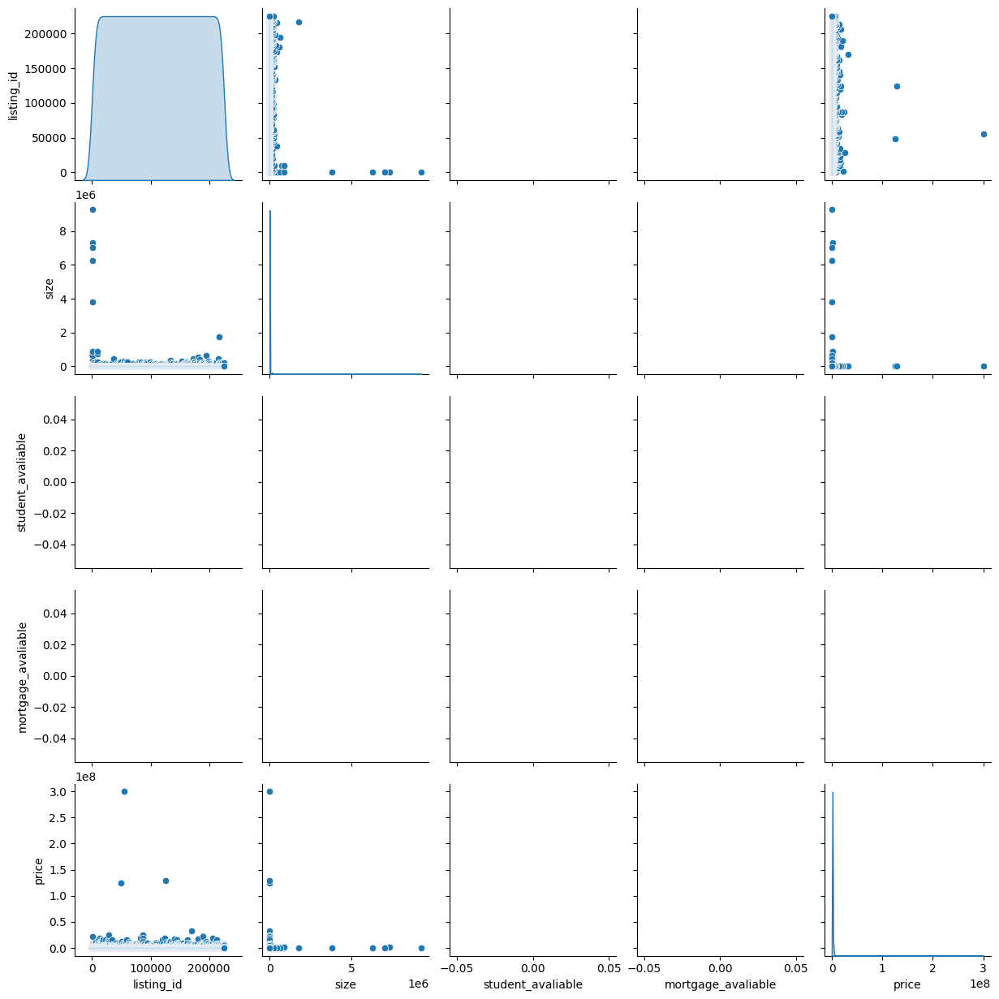

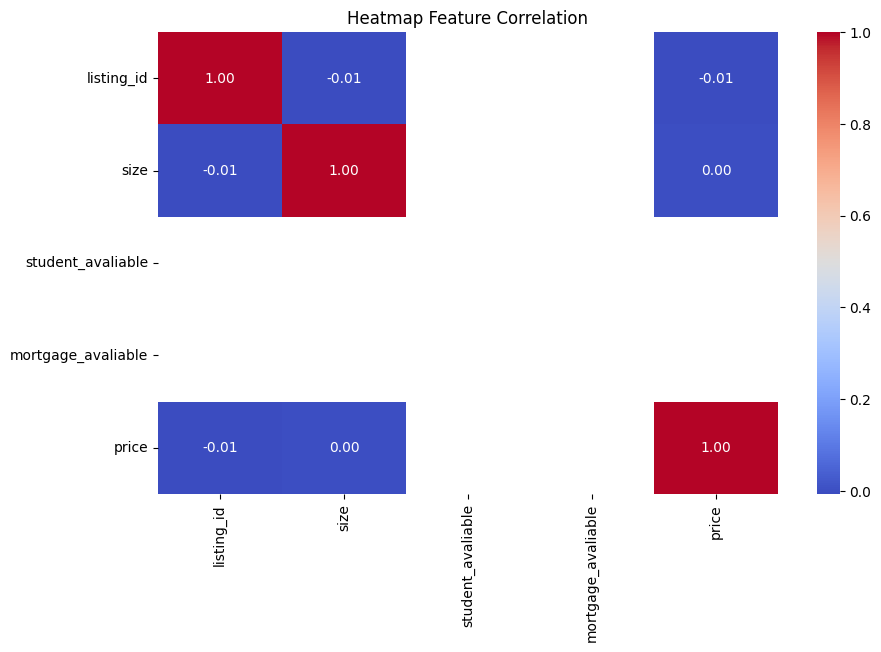

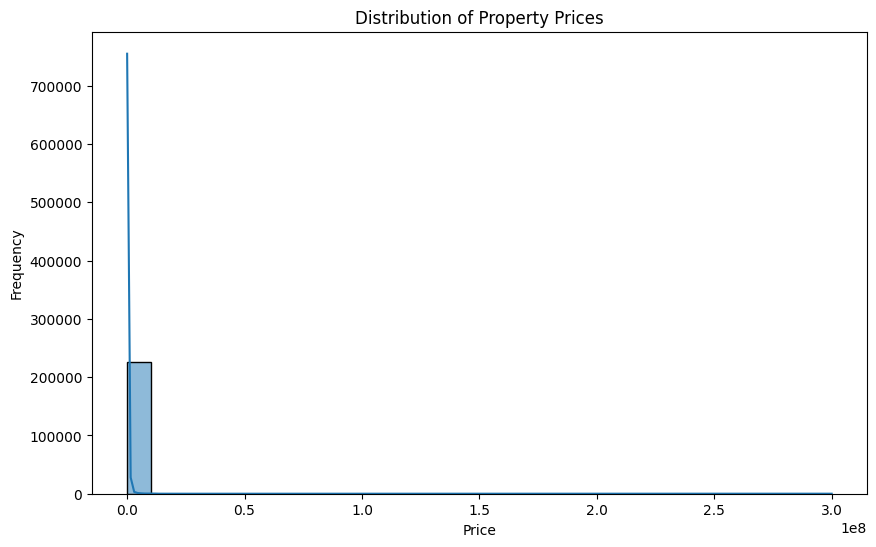

Columns 'sqft' or 'price' not found in dataset.


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

data = pd.read_csv('listing_data_publish.csv')
print(data.head())

sns.pairplot(data, diag_kind='kde')
plt.show()

plt.figure(figsize=(10, 6))
sns.heatmap(data.select_dtypes(include=['number']).corr(), annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Heatmap Feature Correlation")
plt.show()

plt.figure(figsize=(10, 6))
sns.histplot(data['price'], bins=30, kde=True)
plt.title("Distribution of Property Prices")
plt.xlabel("Price")
plt.ylabel("Frequency")
plt.show()

if 'sqft' in data.columns and 'price' in data.columns:
    plt.figure(figsize=(10, 6))
    sns.scatterplot(x='sqft', y='price', data=data, alpha=0.5)
    plt.title("Square Footage vs Price")
    plt.xlabel("Square Footage")
    plt.ylabel("Price")
    plt.show()
else:
    print("Columns 'sqft' or 'price' not found in dataset.")


3. Data Cleaning & Preprocessing
● Implement appropriate techniques to handle missing values

● Detect and address outliers using established methodologies

● Standardize inconsistent data entries and correct anomalies

● Document and justify each cleaning method based on its impact on data integrity

   listing_id   type sub_type start_date end_date listing_type building_age  \
0           1  Konut    Daire     1/3/19   1/3/19      satılık            3   
1           2  Konut    Daire     1/2/19   1/2/19      satılık            0   
2           3  Konut    Daire     1/2/19   1/2/19      satılık            0   
3           4  Konut    Daire     1/2/19   1/2/19      satılık            0   
4           5  Konut    Daire     1/2/19   1/2/19      satılık            0   

  total_floor_count floor_no room_count   size  student_avaliable  \
0                 4    Kot 3        3+1  130.0                NaN   
1                 5        1        4+1  175.0                NaN   
2                 3        1        3+1  125.0                NaN   
3                10        7        2+1   72.0                NaN   
4                 4        3        1+1   75.0                NaN   

   mortgage_avaliable                           address furnished  \
0                 NaN              Kocael

<ipython-input-9-2777ca76aa65>:8: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data.fillna(method='ffill', inplace=True)


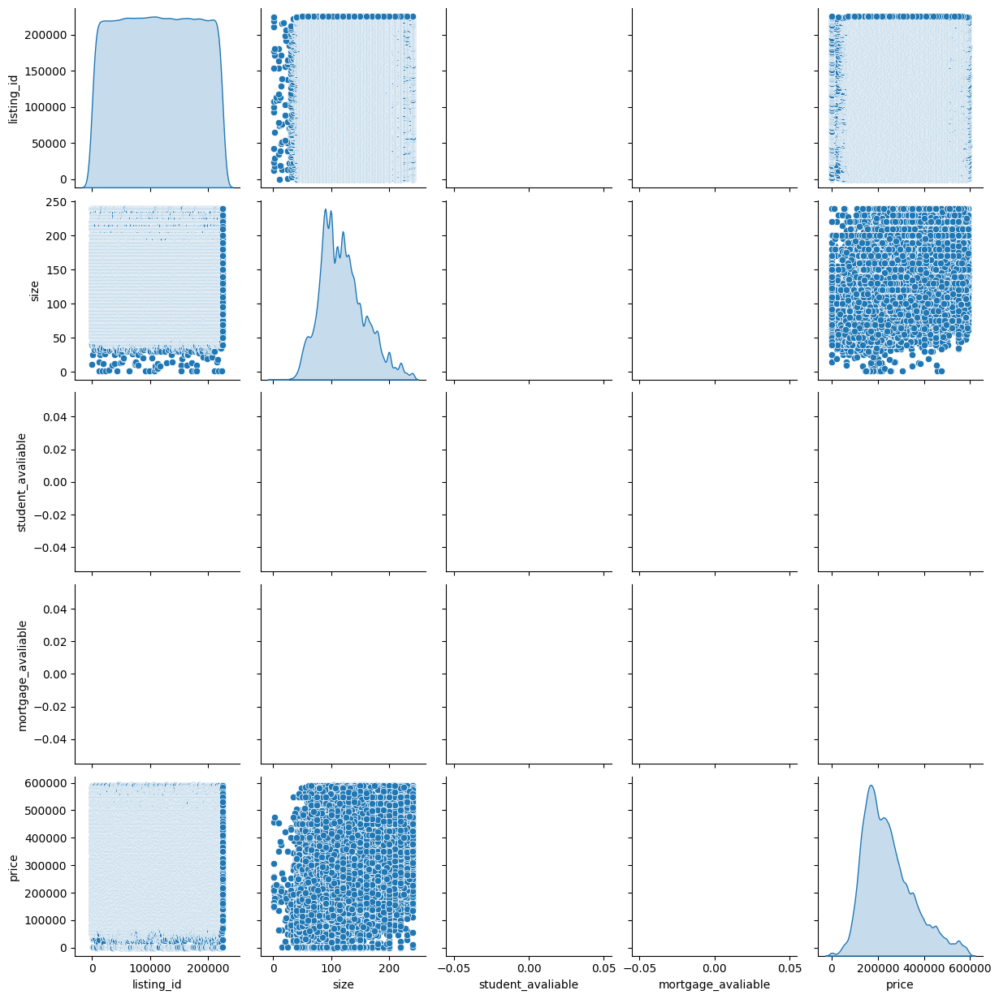

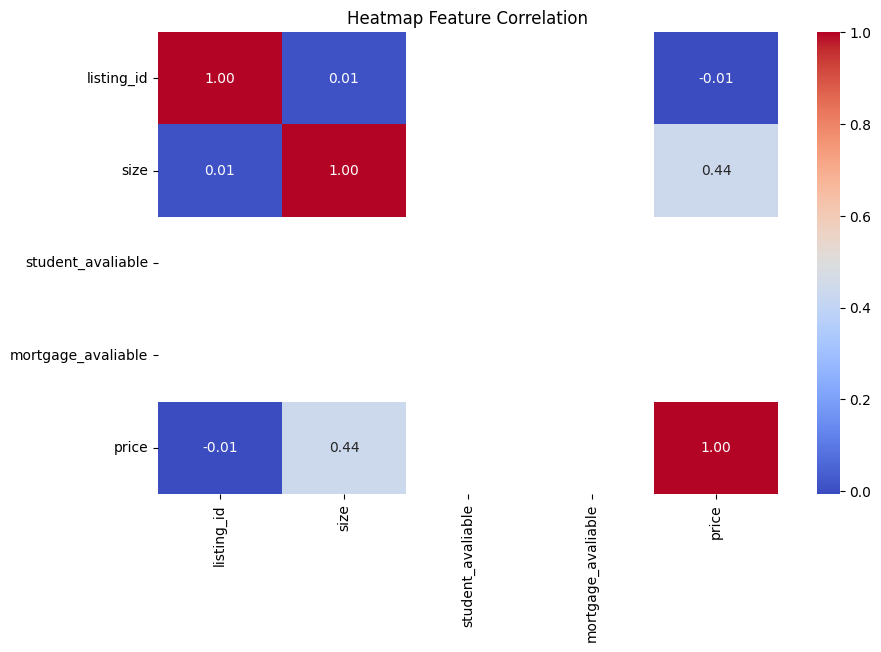

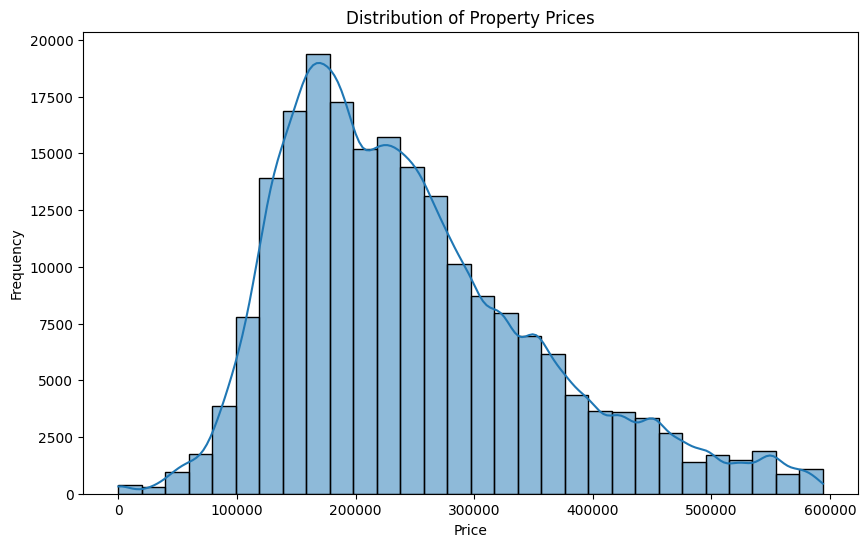

Columns 'sqft' or 'price' not found in dataset.


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

data = pd.read_csv('listing_data_publish.csv')
print(data.head())

data.fillna(method='ffill', inplace=True)

numerical_cols = data.select_dtypes(include=['number']).columns
Q1 = data[numerical_cols].quantile(0.25)
Q3 = data[numerical_cols].quantile(0.75)
IQR = Q3 - Q1

data = data[~((data[numerical_cols] < (Q1 - 1.5 * IQR)) | (data[numerical_cols] > (Q3 + 1.5 * IQR))).any(axis=1)]

data = data.apply(lambda x: x.str.strip().str.lower() if x.dtype == "object" else x)

sns.pairplot(data, diag_kind='kde')
plt.show()

plt.figure(figsize=(10, 6))
sns.heatmap(data.select_dtypes(include=['number']).corr(), annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Heatmap Feature Correlation")
plt.show()

plt.figure(figsize=(10, 6))
sns.histplot(data['price'], bins=30, kde=True)
plt.title("Distribution of Property Prices")
plt.xlabel("Price")
plt.ylabel("Frequency")
plt.show()

if 'sqft' in data.columns and 'price' in data.columns:
    plt.figure(figsize=(10, 6))
    sns.scatterplot(x='sqft', y='price', data=data, alpha=0.5)
    plt.title("Square Footage vs Price")
    plt.xlabel("Square Footage")
    plt.ylabel("Price")
    plt.show()
else:
    print("Columns 'sqft' or 'price' not found in dataset.")


4. Data Transformation & Feature Engineering
● Transform variables to improve their usefulness for analysis
● Implement appropriate encoding techniques for categorical variables
● Apply normalization and scaling methods where necessary

   listing_id   type sub_type start_date end_date listing_type building_age  \
0           1  Konut    Daire     1/3/19   1/3/19      satılık            3   
1           2  Konut    Daire     1/2/19   1/2/19      satılık            0   
2           3  Konut    Daire     1/2/19   1/2/19      satılık            0   
3           4  Konut    Daire     1/2/19   1/2/19      satılık            0   
4           5  Konut    Daire     1/2/19   1/2/19      satılık            0   

  total_floor_count floor_no room_count   size  student_avaliable  \
0                 4    Kot 3        3+1  130.0                NaN   
1                 5        1        4+1  175.0                NaN   
2                 3        1        3+1  125.0                NaN   
3                10        7        2+1   72.0                NaN   
4                 4        3        1+1   75.0                NaN   

   mortgage_avaliable                           address furnished  \
0                 NaN              Kocael

<ipython-input-3-a438e2e5001e>:9: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data.fillna(method='ffill', inplace=True)
/usr/local/lib/python3.11/dist-packages/sklearn/utils/extmath.py:1101: RuntimeWarning: invalid value encountered in divide
  updated_mean = (last_sum + new_sum) / updated_sample_count
/usr/local/lib/python3.11/dist-packages/sklearn/utils/extmath.py:1106: RuntimeWarning: invalid value encountered in divide
  T = new_sum / new_sample_count
/usr/local/lib/python3.11/dist-packages/sklearn/utils/extmath.py:1126: RuntimeWarning: invalid value encountered in divide
  new_unnormalized_variance -= correction**2 / new_sample_count


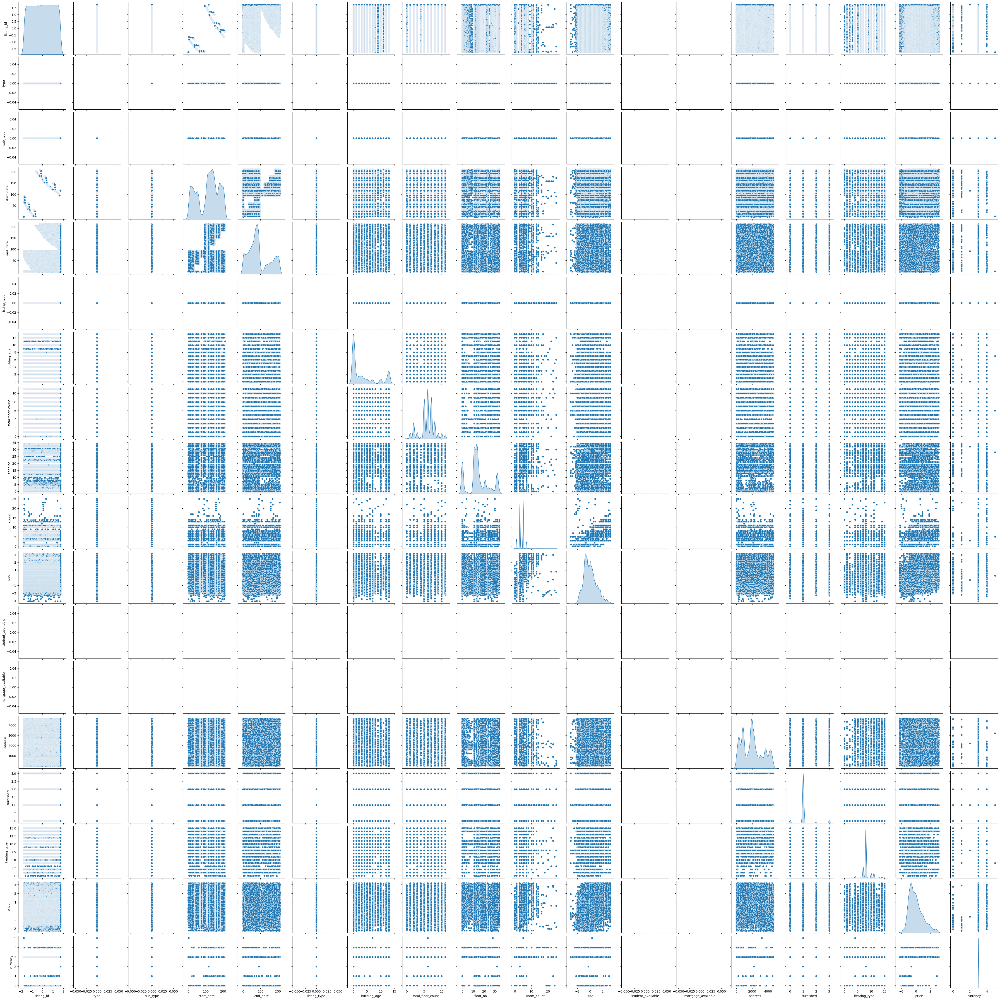

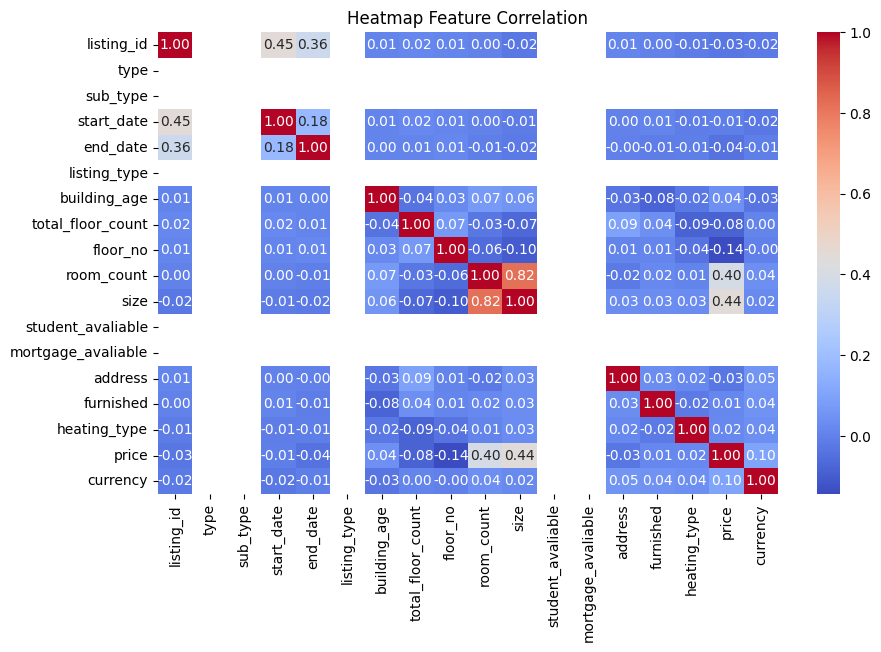

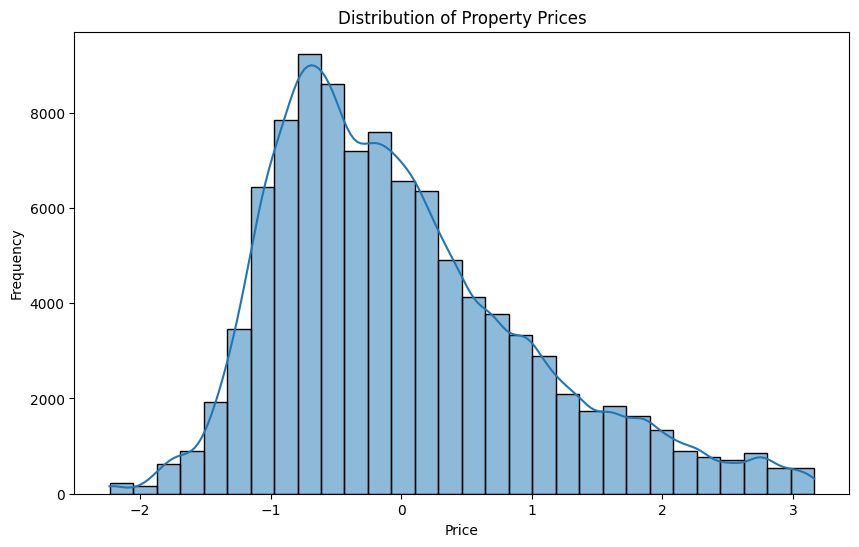

Columns 'sqft' or 'price' not found in dataset.


In [3]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler, MinMaxScaler, LabelEncoder

data = pd.read_csv('listing_data_publish.csv')
print(data.head())

data.fillna(method='ffill', inplace=True)

numerical_cols = data.select_dtypes(include=['number']).columns
Q1 = data[numerical_cols].quantile(0.25)
Q3 = data[numerical_cols].quantile(0.75)
IQR = Q3 - Q1

data = data[~((data[numerical_cols] < (Q1 - 1.5 * IQR)) | (data[numerical_cols] > (Q3 + 1.5 * IQR))).any(axis=1)]

data = data.apply(lambda x: x.str.strip().str.lower() if x.dtype == "object" else x)

categorical_cols = data.select_dtypes(include=['object']).columns
label_encoders = {col: LabelEncoder().fit(data[col]) for col in categorical_cols}
data[categorical_cols] = data[categorical_cols].apply(lambda x: label_encoders[x.name].transform(x))

scaler = StandardScaler()
data[numerical_cols] = scaler.fit_transform(data[numerical_cols])

sns.pairplot(data, diag_kind='kde')
plt.show()

plt.figure(figsize=(10, 6))
sns.heatmap(data.select_dtypes(include=['number']).corr(), annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Heatmap Feature Correlation")
plt.show()

plt.figure(figsize=(10, 6))
sns.histplot(data['price'], bins=30, kde=True)
plt.title("Distribution of Property Prices")
plt.xlabel("Price")
plt.ylabel("Frequency")
plt.show()

if 'sqft' in data.columns and 'price' in data.columns:
    plt.figure(figsize=(10, 6))
    sns.scatterplot(x='sqft', y='price', data=data, alpha=0.5)
    plt.title("Square Footage vs Price")
    plt.xlabel("Square Footage")
    plt.ylabel("Price")
    plt.show()
else:
    print("Columns 'sqft' or 'price' not found in dataset.")


5. Exploratory Data Analysis (EDA)
● Conduct in-depth analysis to uncover hidden patterns in the data
● Perform correlation analysis to identify relationships between variables
● Investigate market segments and their unique characteristics
● Generate actionable insights that could guide strategic decisions at Zingat

   listing_id   type sub_type start_date end_date listing_type building_age  \
0           1  Konut    Daire     1/3/19   1/3/19      satılık            3   
1           2  Konut    Daire     1/2/19   1/2/19      satılık            0   
2           3  Konut    Daire     1/2/19   1/2/19      satılık            0   
3           4  Konut    Daire     1/2/19   1/2/19      satılık            0   
4           5  Konut    Daire     1/2/19   1/2/19      satılık            0   

  total_floor_count floor_no room_count   size  student_avaliable  \
0                 4    Kot 3        3+1  130.0                NaN   
1                 5        1        4+1  175.0                NaN   
2                 3        1        3+1  125.0                NaN   
3                10        7        2+1   72.0                NaN   
4                 4        3        1+1   75.0                NaN   

   mortgage_avaliable                           address furnished  \
0                 NaN              Kocael

<ipython-input-5-0590d94f53d7>:9: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data.fillna(method='ffill', inplace=True)


Columns in dataset: Index(['listing_id', 'type', 'sub_type', 'start_date', 'end_date',
       'listing_type', 'building_age', 'total_floor_count', 'floor_no',
       'room_count', 'size', 'student_avaliable', 'mortgage_avaliable',
       'address', 'furnished', 'heating_type', 'price', 'currency'],
      dtype='object')


/usr/local/lib/python3.11/dist-packages/sklearn/utils/extmath.py:1101: RuntimeWarning: invalid value encountered in divide
  updated_mean = (last_sum + new_sum) / updated_sample_count
/usr/local/lib/python3.11/dist-packages/sklearn/utils/extmath.py:1106: RuntimeWarning: invalid value encountered in divide
  T = new_sum / new_sample_count
/usr/local/lib/python3.11/dist-packages/sklearn/utils/extmath.py:1126: RuntimeWarning: invalid value encountered in divide
  new_unnormalized_variance -= correction**2 / new_sample_count


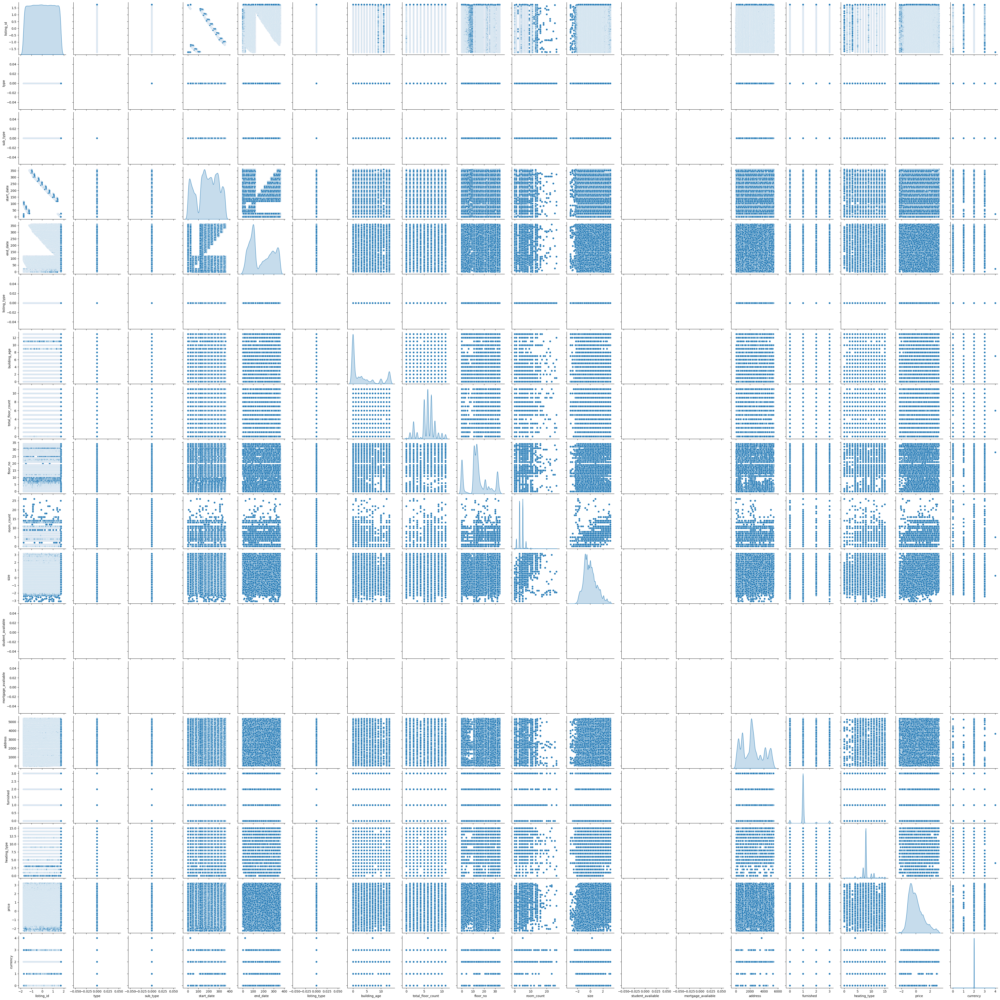

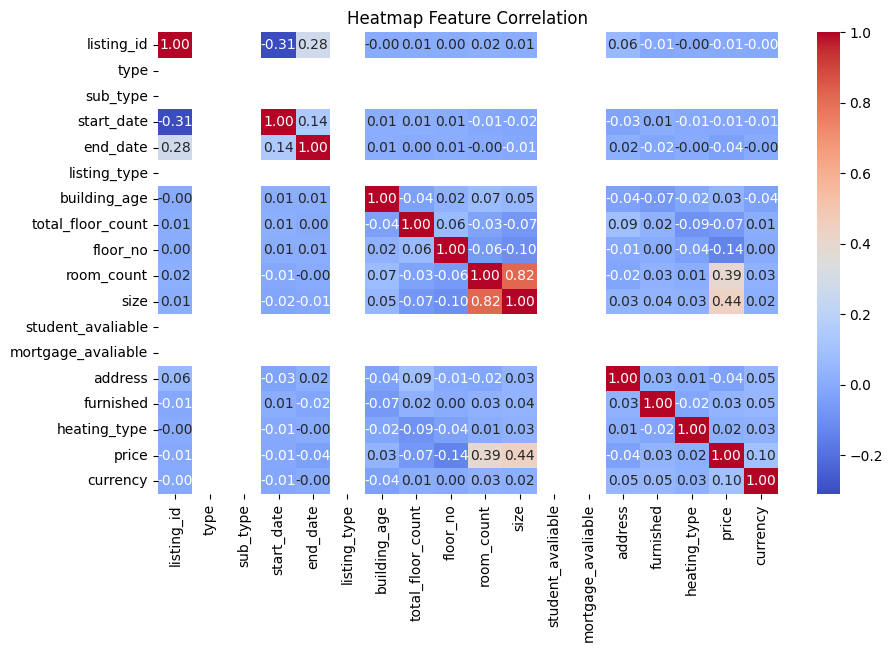

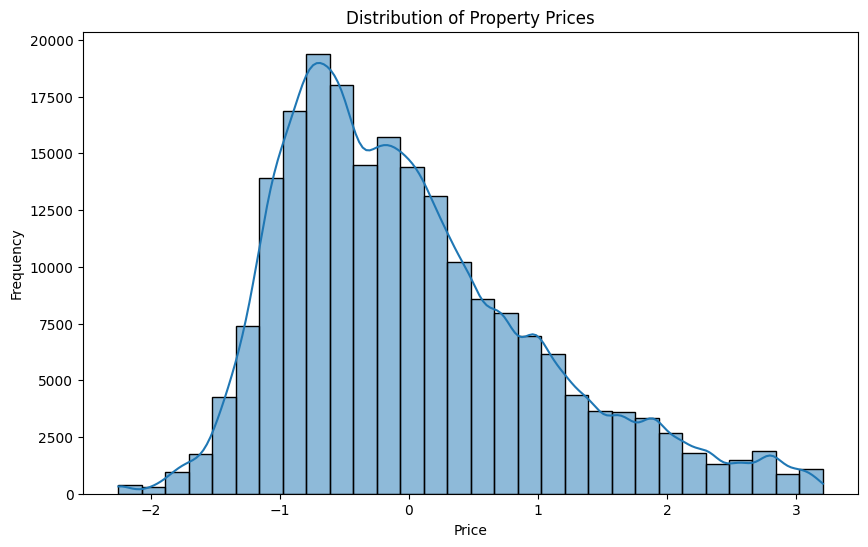

Columns 'sqft' or 'price' not found in dataset.
Columns 'property_type' or 'price' not found in dataset.
Columns 'location' or 'price' not found in dataset.
Column 'property_type' not found in dataset.


In [5]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler, LabelEncoder

data = pd.read_csv('listing_data_publish.csv')
print(data.head())

data.fillna(method='ffill', inplace=True)

print("Columns in dataset:", data.columns)

numerical_cols = data.select_dtypes(include=['number']).columns
Q1 = data[numerical_cols].quantile(0.25)
Q3 = data[numerical_cols].quantile(0.75)
IQR = Q3 - Q1

data = data[~((data[numerical_cols] < (Q1 - 1.5 * IQR)) | (data[numerical_cols] > (Q3 + 1.5 * IQR))).any(axis=1)]

data = data.apply(lambda x: x.str.strip().str.lower() if x.dtype == "object" else x)

categorical_cols = data.select_dtypes(include=['object']).columns
label_encoders = {col: LabelEncoder().fit(data[col]) for col in categorical_cols}
data[categorical_cols] = data[categorical_cols].apply(lambda x: label_encoders[x.name].transform(x))

scaler = StandardScaler()
data[numerical_cols] = scaler.fit_transform(data[numerical_cols])

sns.pairplot(data, diag_kind='kde')
plt.show()

plt.figure(figsize=(10, 6))
sns.heatmap(data.select_dtypes(include=['number']).corr(), annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Heatmap Feature Correlation")
plt.show()

plt.figure(figsize=(10, 6))
sns.histplot(data['price'], bins=30, kde=True)
plt.title("Distribution of Property Prices")
plt.xlabel("Price")
plt.ylabel("Frequency")
plt.show()

if 'sqft' in data.columns and 'price' in data.columns:
    plt.figure(figsize=(10, 6))
    sns.scatterplot(x='sqft', y='price', data=data, alpha=0.5)
    plt.title("Square Footage vs Price")
    plt.xlabel("Square Footage")
    plt.ylabel("Price")
    plt.show()
else:
    print("Columns 'sqft' or 'price' not found in dataset.")

if 'property_type' in data.columns and 'price' in data.columns:
    plt.figure(figsize=(10, 6))
    sns.boxplot(x='property_type', y='price', data=data)
    plt.title("Price Distribution by Property Type")
    plt.xticks(rotation=45)
    plt.show()
else:
    print("Columns 'property_type' or 'price' not found in dataset.")

if 'location' in data.columns and 'price' in data.columns:
    plt.figure(figsize=(10, 6))
    sns.barplot(x='location', y='price', data=data)
    plt.title("Average Price by Location")
    plt.xticks(rotation=45)
    plt.show()
else:
    print("Columns 'location' or 'price' not found in dataset.")

if 'property_type' in data.columns:
    market_segments = data.groupby('property_type')['price'].mean().sort_values()
    print("Market Segments and Average Prices:")
    print(market_segments)
else:
    print("Column 'property_type' not found in dataset.")
